In [10]:
from PIL import Image
import cv2 as cv
import os
import sys
from tqdm.notebook import tqdm
from dotenv import load_dotenv
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from ultralytics import YOLO

sys.path.append(os.path.abspath(os.path.join(os.getcwd(), '..')))
from utils.plot_wrapper import *
from utils.fix_resolutions import *

In [11]:
load_dotenv()
root = os.getenv("root", ".")

tiger_name = "K 15 M"

In [12]:
data_path = os.path.join(root, "data")
tiger_path = os.path.join(data_path, tiger_name)

images = [cv.imread(os.path.join(tiger_path, f)) for f in os.listdir(tiger_path)]
images = [cv.cvtColor(img, cv.COLOR_BGR2RGB) for img in images]

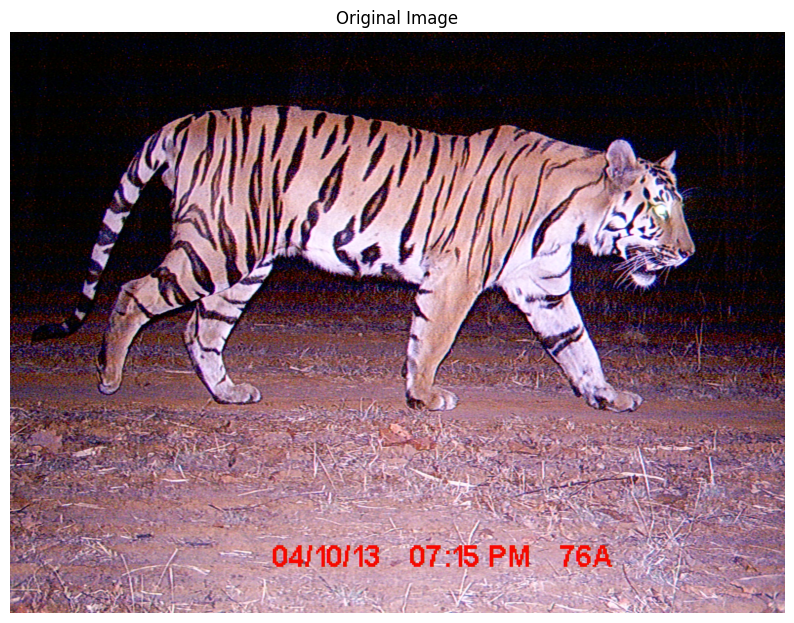

In [13]:
test_img = images[1]
plot_image(test_img, title="Original Image")

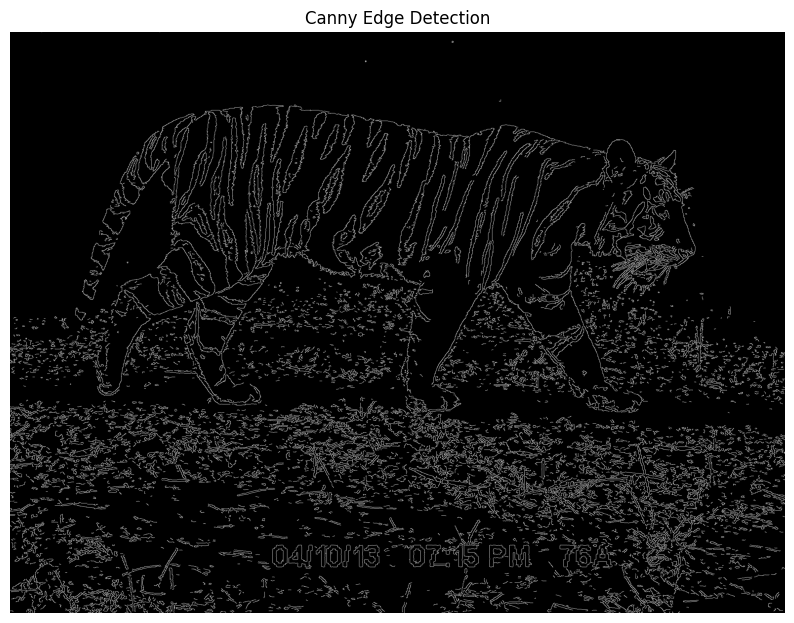

In [14]:
grey = cv.cvtColor(test_img, cv.COLOR_RGB2GRAY)

canny = cv.Canny(grey, 150, 250)
plot_image(canny, title="Canny Edge Detection", cmap='gray')

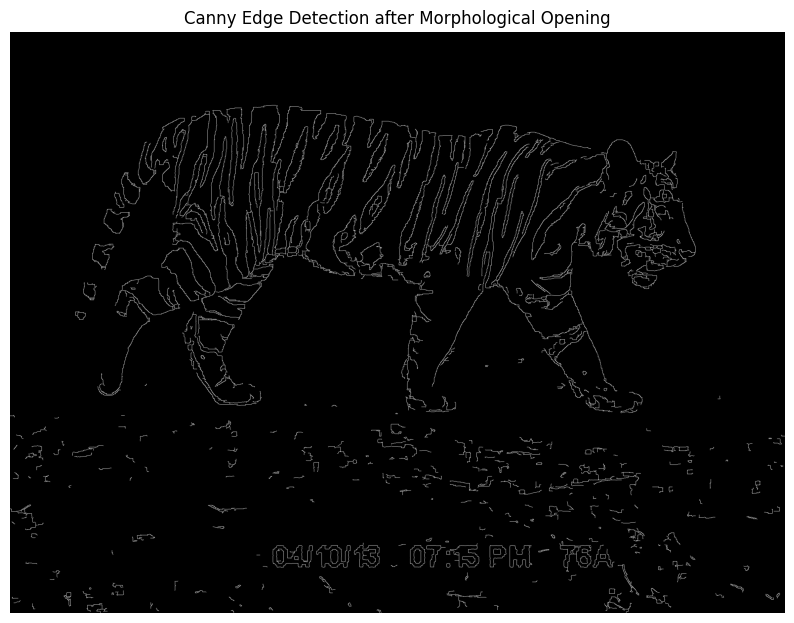

In [15]:
kernel = np.ones((10, 10), np.uint8)
opened = cv.morphologyEx(grey, cv.MORPH_OPEN, kernel)
canny = cv.Canny(opened, 100, 250)

plot_image(canny, title="Canny Edge Detection after Morphological Opening", cmap='gray')

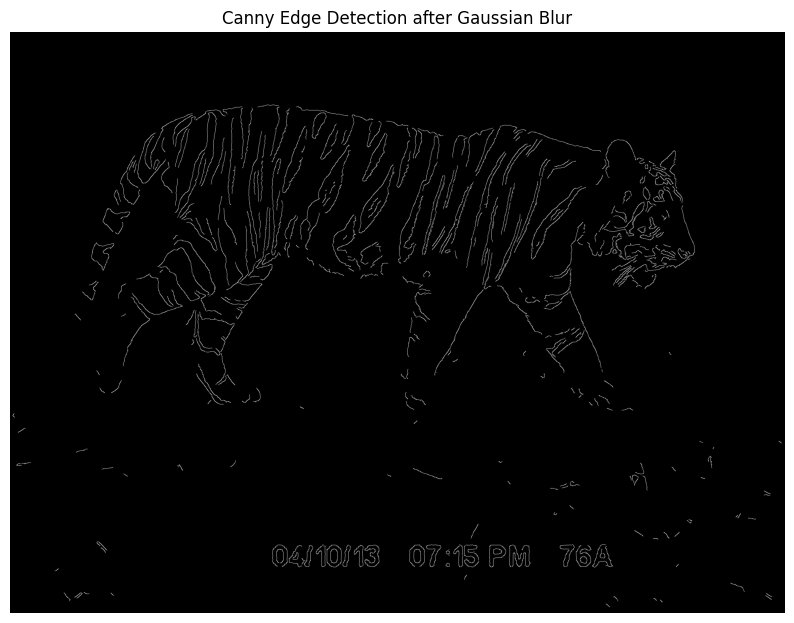

In [16]:
blurred = cv.GaussianBlur(test_img, (7, 7), 5)
canny = cv.Canny(blurred, 150, 250)

plot_image(canny, title="Canny Edge Detection after Gaussian Blur", cmap='gray')

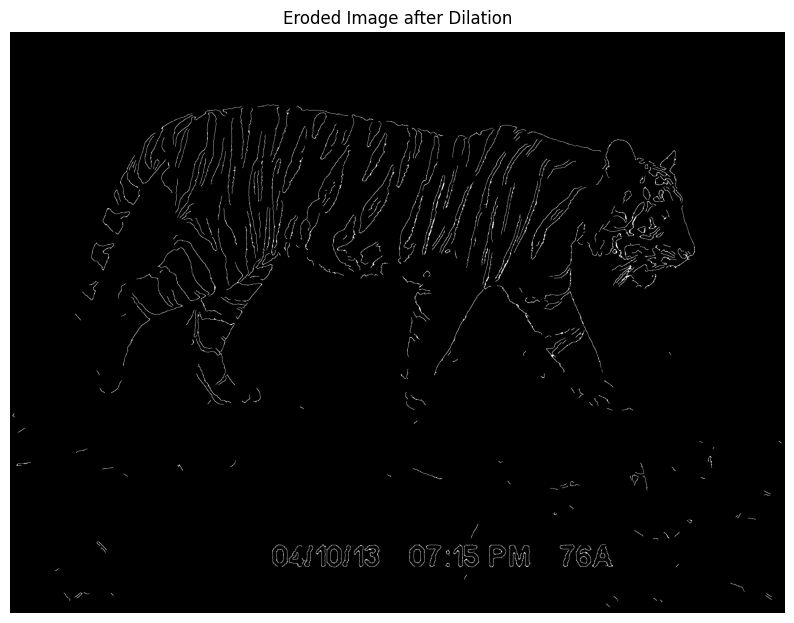

In [17]:
dilated = cv.dilate(canny, np.ones((3, 3)), iterations=1)
eroded = cv.erode(dilated, np.ones((3, 3), np.uint8), iterations=1)
plot_image(eroded, title="Eroded Image after Dilation", cmap='gray')

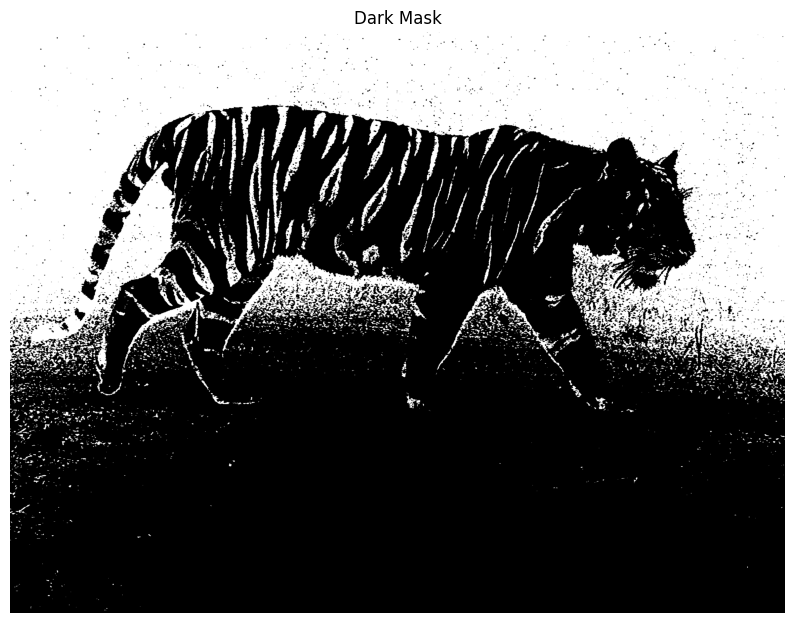

In [18]:
test_img_hsv = cv.cvtColor(test_img, cv.COLOR_RGB2HSV)

lower_dark = np.array([0, 0, 0])
upper_dark = np.array([180, 255, 70])

mask_dark = cv.inRange(test_img_hsv, lower_dark, upper_dark)
plot_image(mask_dark, title="Dark Mask", cmap='gray')

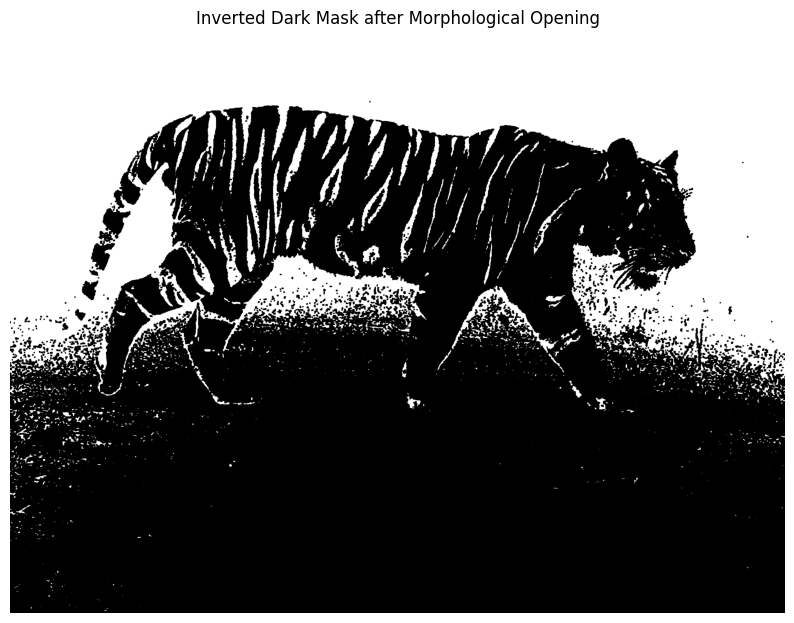

In [19]:
mask_dark_inverted = cv.bitwise_not(mask_dark)
mask_dark_opened = cv.morphologyEx(mask_dark_inverted, cv.MORPH_OPEN, np.ones((4, 4), np.uint8))
mask_dark_opened = cv.bitwise_not(mask_dark_opened)
plot_image(mask_dark_opened, title="Inverted Dark Mask after Morphological Opening", cmap='gray')

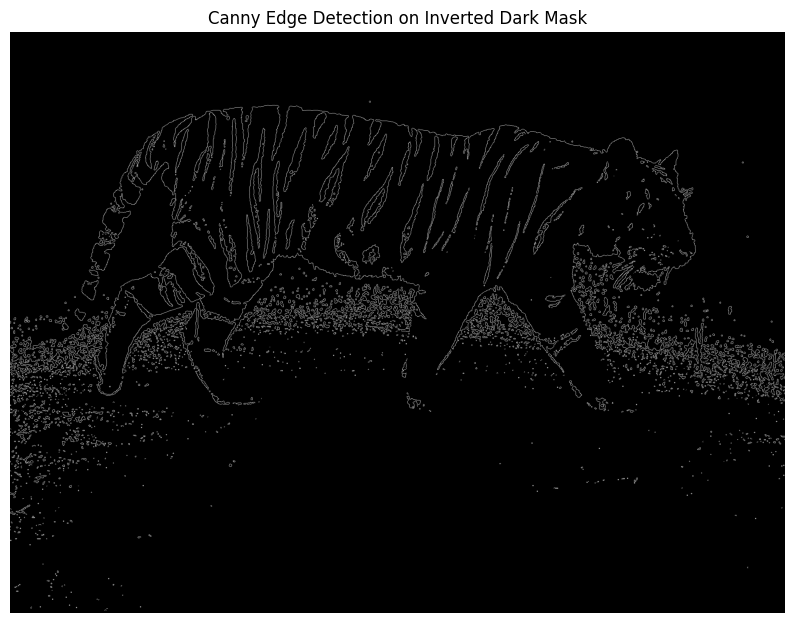

In [20]:
canny_masked = cv.Canny(mask_dark_opened, 150, 250)
plot_image(canny_masked, title="Canny Edge Detection on Inverted Dark Mask", cmap='gray')

In [21]:
def find_edges(image):
    image_hsv = cv.cvtColor(image, cv.COLOR_RGB2HSV)
    lower_dark = np.array([0, 0, 0])
    upper_dark = np.array([180, 255, 50])
    mask_dark = cv.inRange(image_hsv, lower_dark, upper_dark)
    mask_dark_inverted = cv.bitwise_not(mask_dark)
    mask_dark_opened = cv.morphologyEx(mask_dark_inverted, cv.MORPH_OPEN, np.ones((4, 4), np.uint8))
    mask_dark_opened = cv.bitwise_not(mask_dark_opened)
    canny_masked = cv.Canny(mask_dark_opened, 150, 250)
    return canny_masked

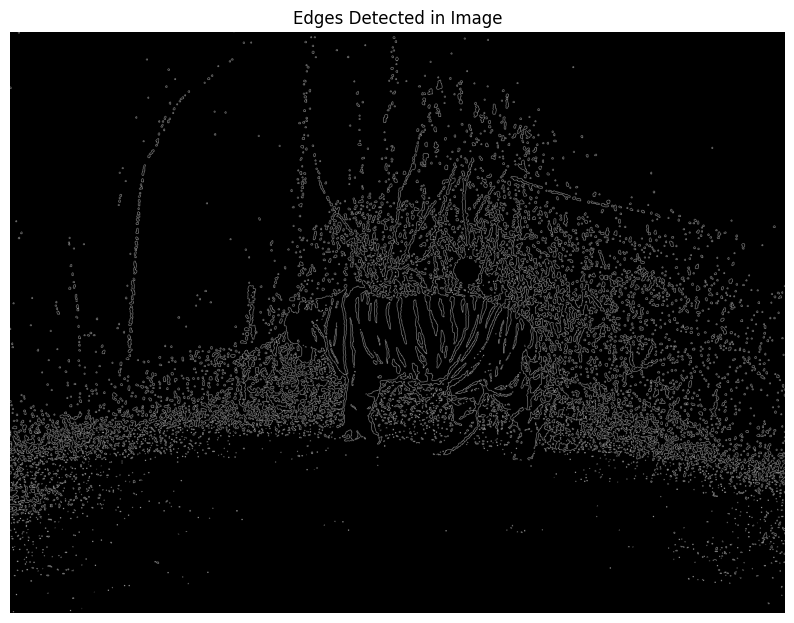

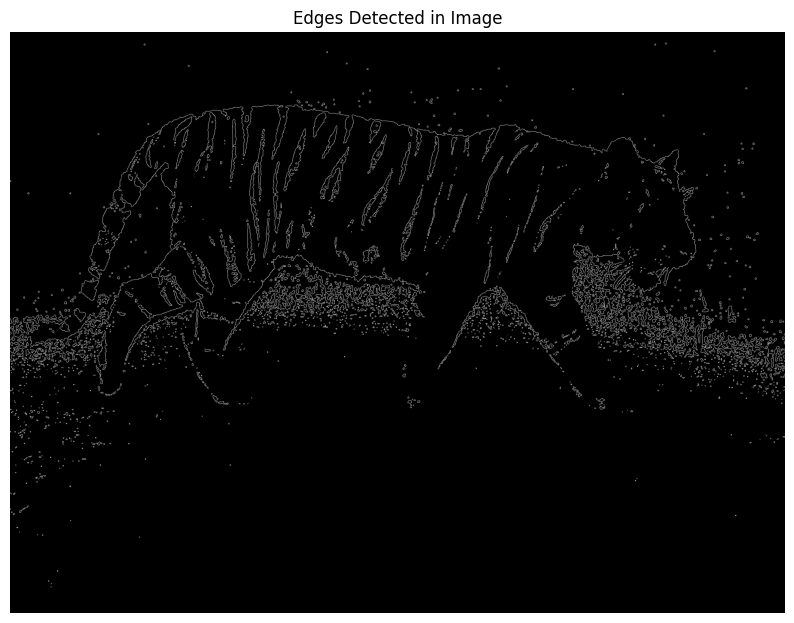

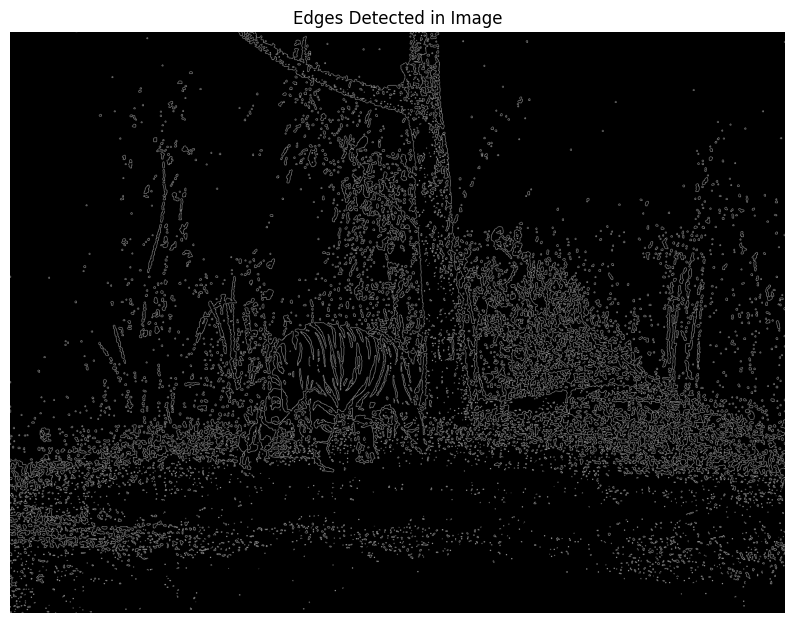

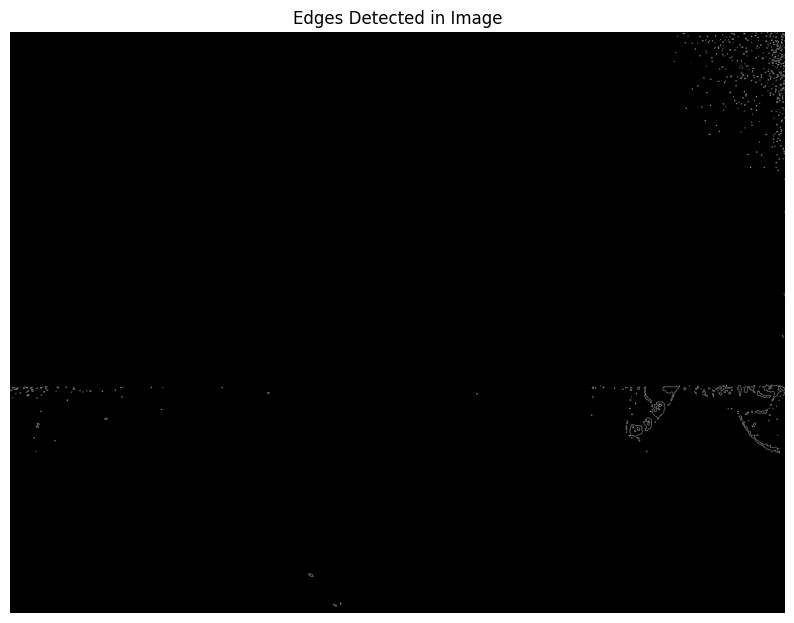

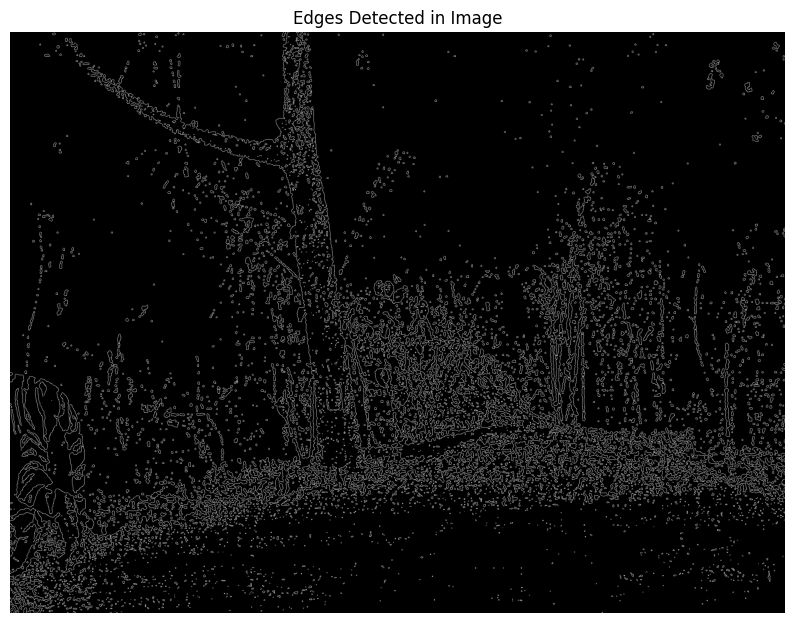

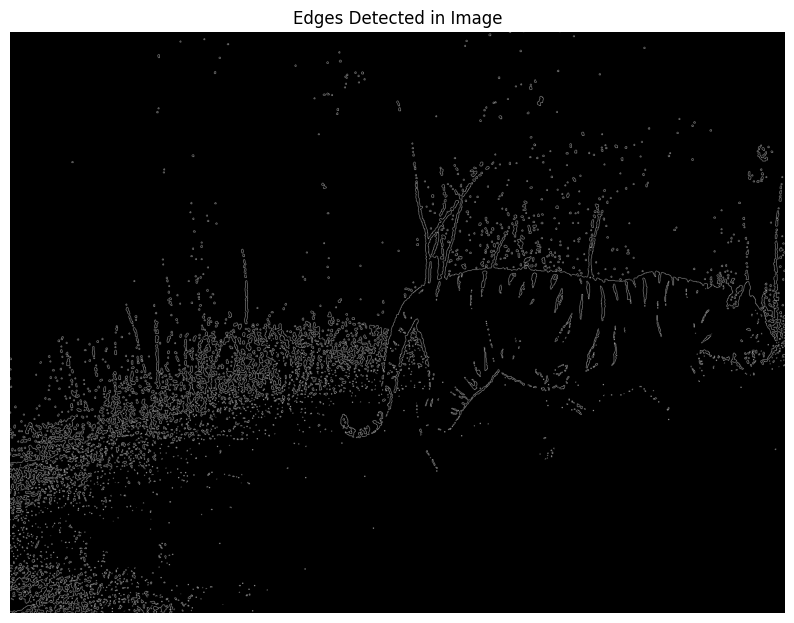

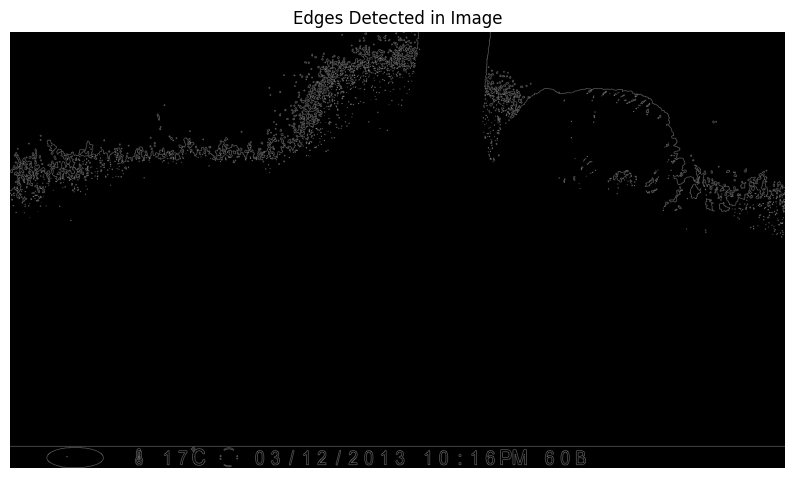

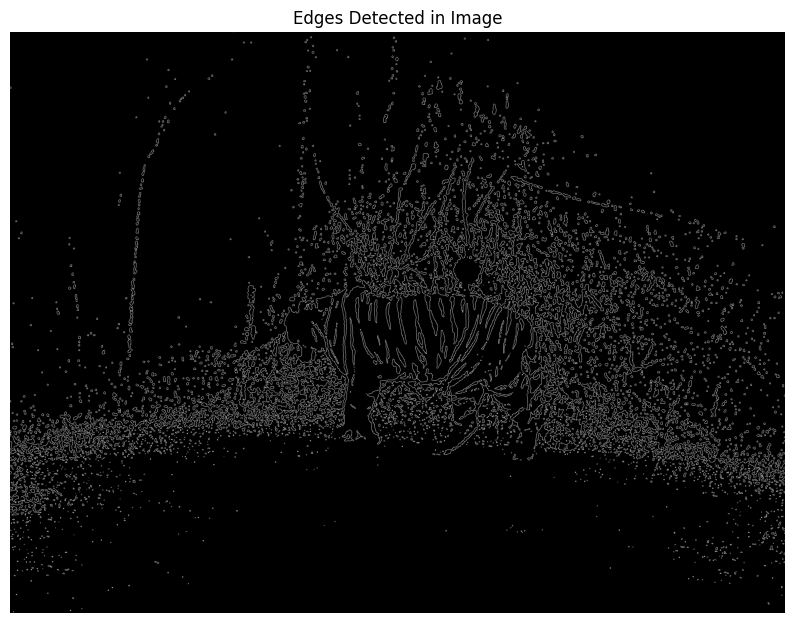

In [22]:
for image in images:
    edges = find_edges(image)
    plot_image(edges, title="Edges Detected in Image", cmap='gray')

Cropping Image

In [23]:
model = YOLO("yolov8n.pt")


0: 480x640 1 person, 204.6ms
Speed: 16.4ms preprocess, 204.6ms inference, 20.7ms postprocess per image at shape (1, 3, 480, 640)


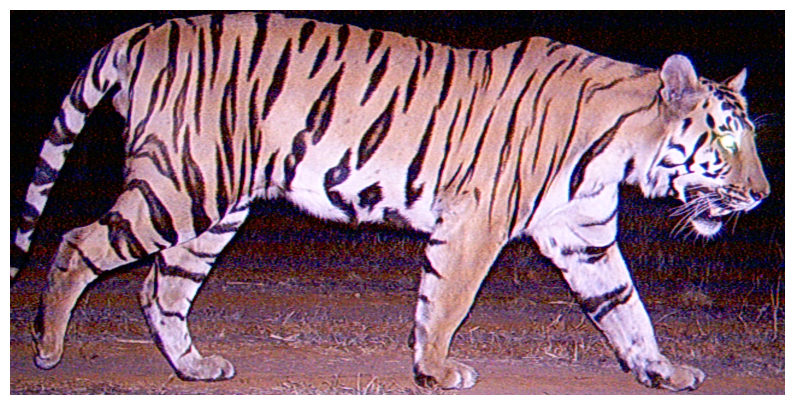

In [24]:
results = model(test_img)

best_box = results[0].boxes[results[0].boxes.conf.argmax()]
x1, y1, x2, y2 = map(int, best_box.xyxy[0])
cropped_tiger = test_img[y1:y2, x1:x2]
plot_image(cropped_tiger)

In [25]:
def crop_tiger(image):
    results = model(image)

    if len(results) == 0 or len(results[0].boxes) == 0:
        return None
    
    box = results[0].boxes[results[0].boxes.conf.argmax()]
    x1, y1, x2, y2 = map(int, box.xyxy[0])

    h, w = image.shape[:2]
    buffer_x = int(0.2 * (x2 - x1))
    buffer_y = int(0.2 * (y2 - y1))

    x1b = max(x1 - buffer_x, 0)
    y1b = max(y1 - buffer_y, 0)
    x2b = min(x2 + buffer_x, w)
    y2b = min(y2 + buffer_y, h)

    cropped_tiger = image[y1b:y2b, x1b:x2b]
    return cropped_tiger


0: 480x640 1 zebra, 71.2ms
Speed: 3.8ms preprocess, 71.2ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


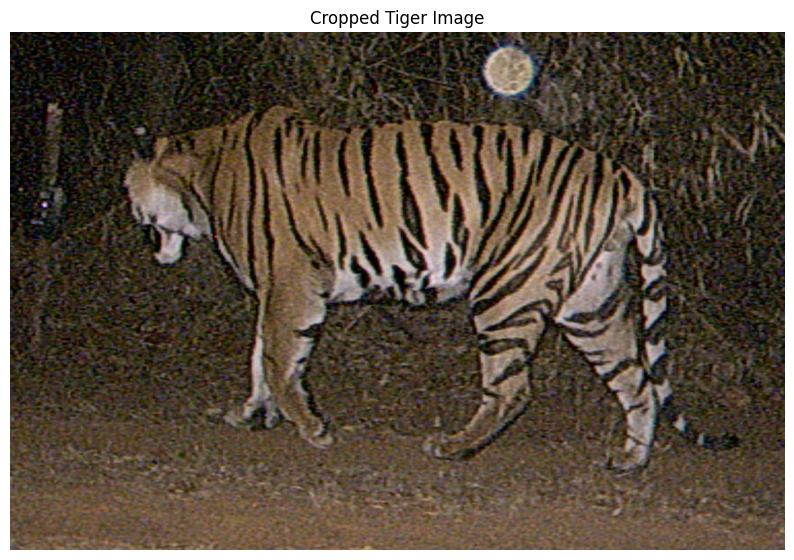


0: 480x640 1 person, 126.2ms
Speed: 4.3ms preprocess, 126.2ms inference, 1.4ms postprocess per image at shape (1, 3, 480, 640)


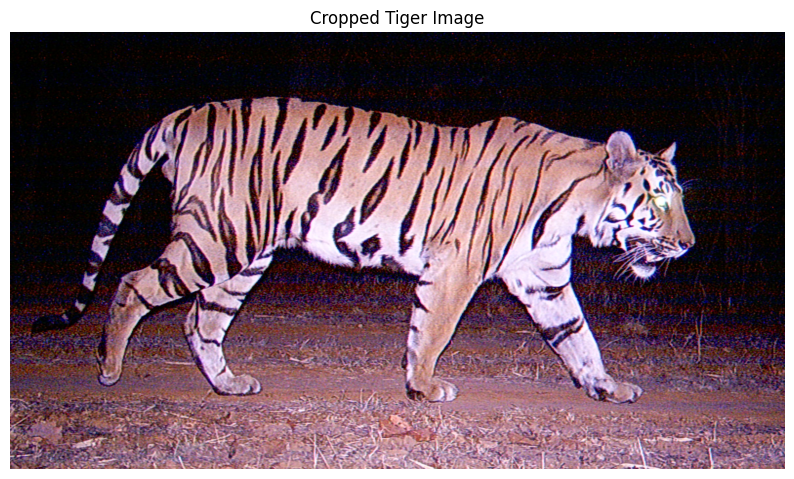


0: 480x640 1 zebra, 130.9ms
Speed: 3.5ms preprocess, 130.9ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)


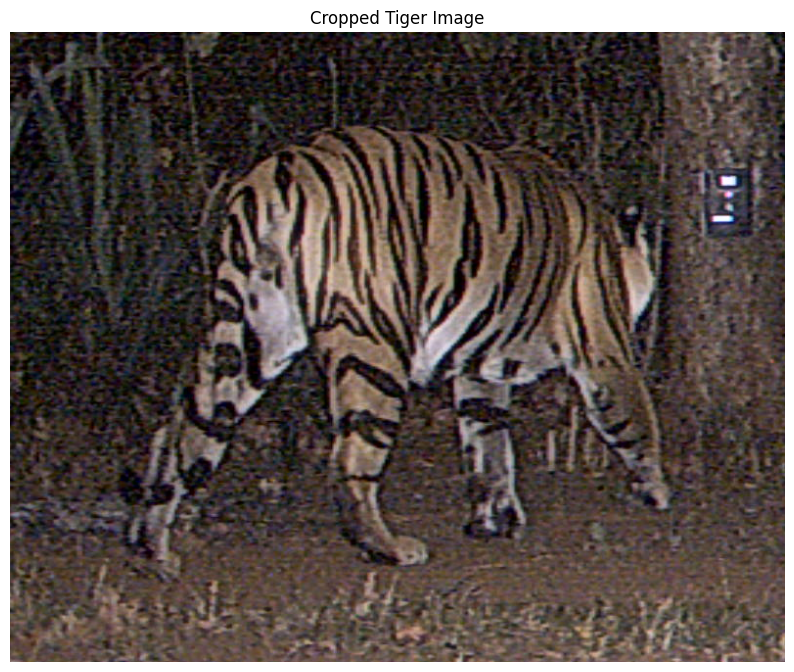


0: 480x640 1 person, 184.6ms
Speed: 4.7ms preprocess, 184.6ms inference, 1.7ms postprocess per image at shape (1, 3, 480, 640)


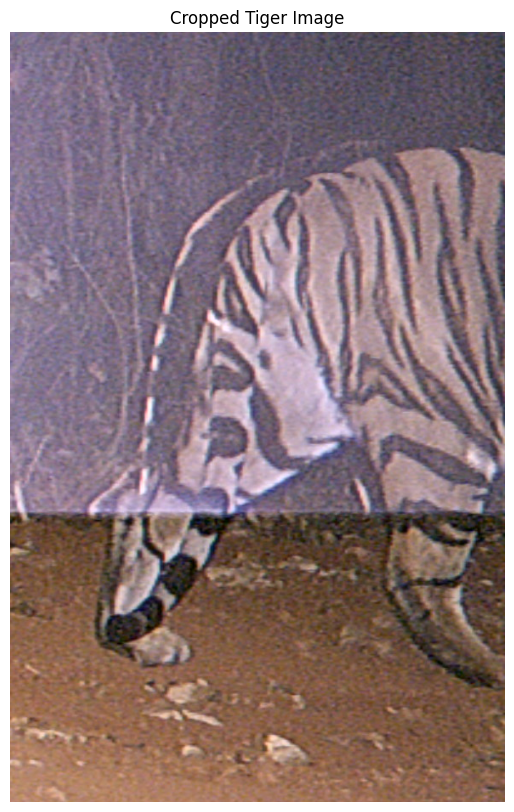


0: 480x640 (no detections), 72.1ms
Speed: 2.3ms preprocess, 72.1ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 zebra, 70.1ms
Speed: 3.6ms preprocess, 70.1ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)


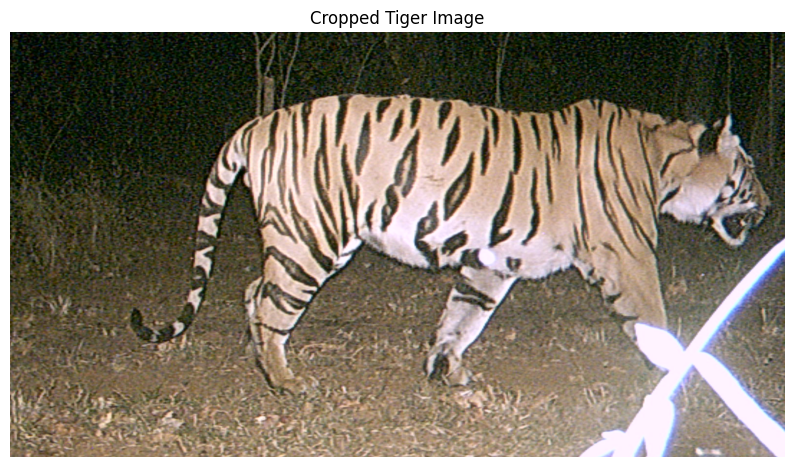


0: 384x640 1 zebra, 177.6ms
Speed: 2.9ms preprocess, 177.6ms inference, 1.7ms postprocess per image at shape (1, 3, 384, 640)


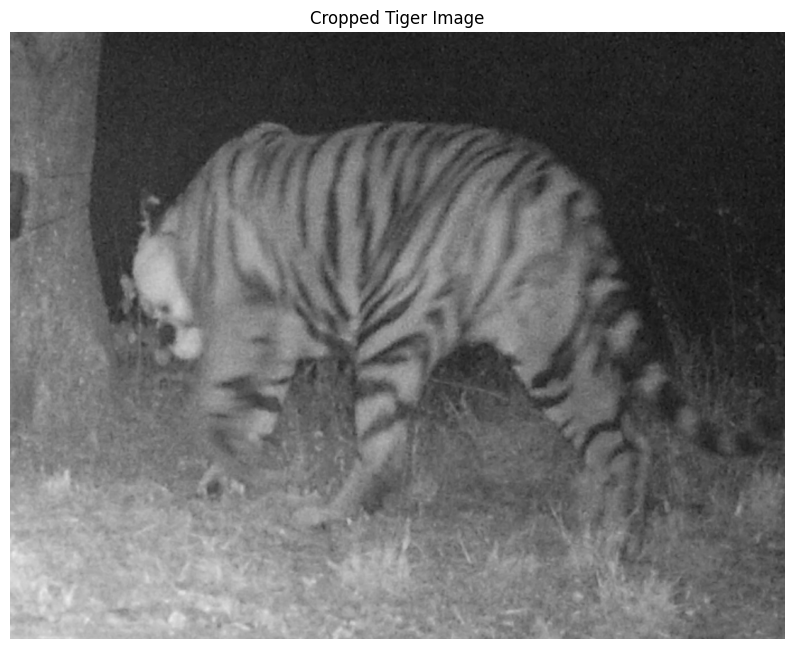


0: 480x640 1 zebra, 97.0ms
Speed: 5.1ms preprocess, 97.0ms inference, 2.5ms postprocess per image at shape (1, 3, 480, 640)


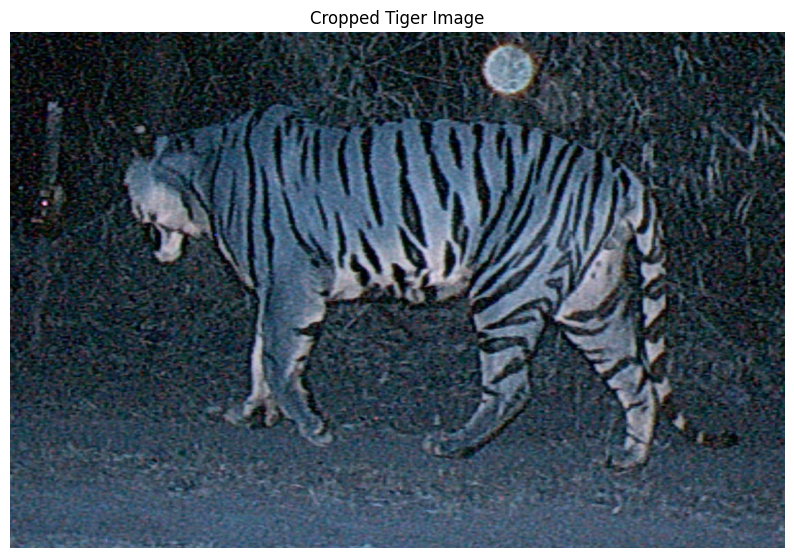

In [26]:
for image in images:
    cropped_image = crop_tiger(image)
    if cropped_image is not None:
        plot_image(cropped_image, title="Cropped Tiger Image")


0: 480x640 1 zebra, 134.5ms
Speed: 72.9ms preprocess, 134.5ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


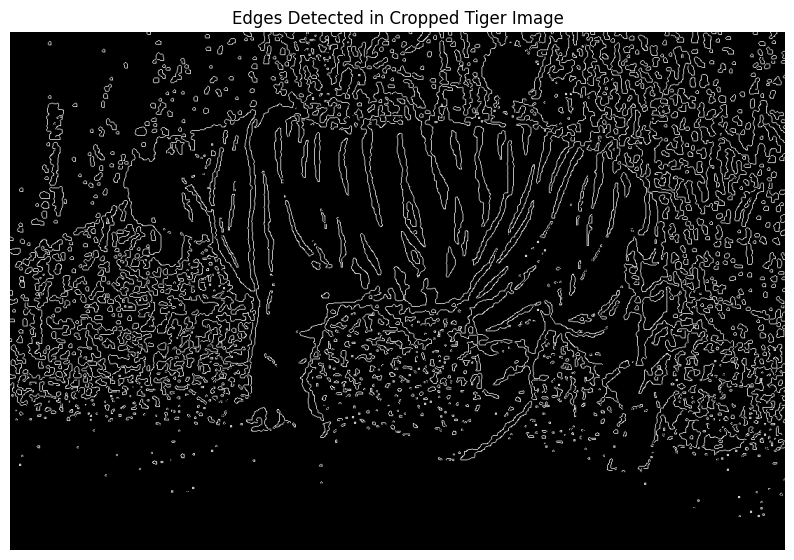


0: 480x640 1 person, 74.2ms
Speed: 3.1ms preprocess, 74.2ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)


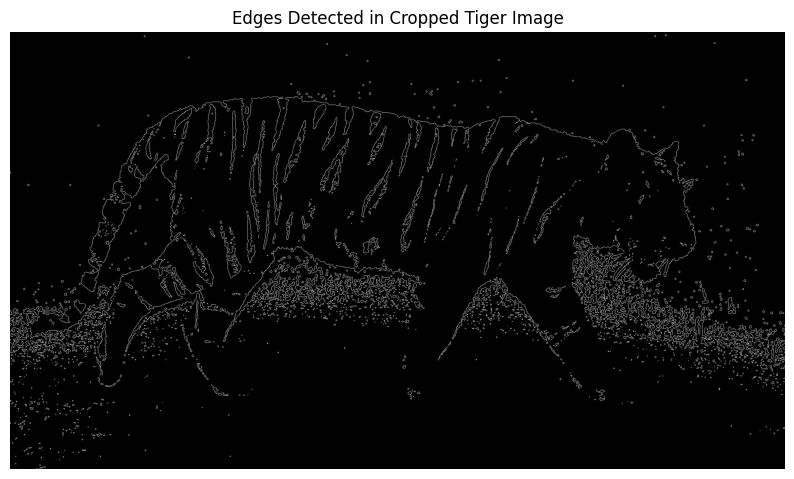


0: 480x640 1 zebra, 83.7ms
Speed: 4.2ms preprocess, 83.7ms inference, 0.9ms postprocess per image at shape (1, 3, 480, 640)


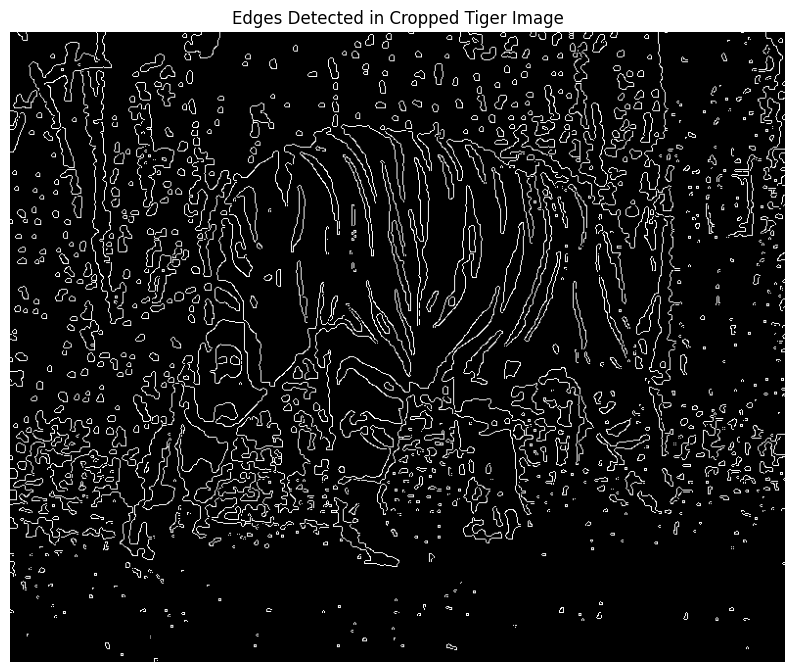


0: 480x640 1 person, 68.7ms
Speed: 2.6ms preprocess, 68.7ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


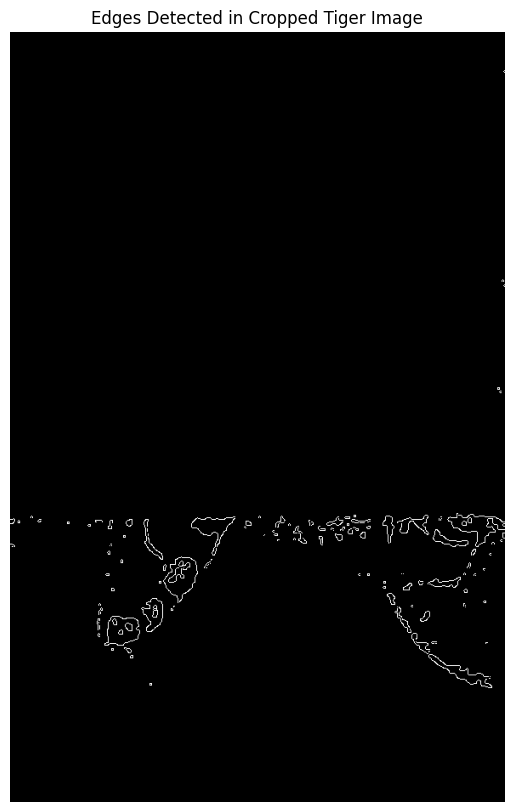


0: 480x640 (no detections), 138.7ms
Speed: 2.9ms preprocess, 138.7ms inference, 0.7ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 zebra, 68.7ms
Speed: 4.1ms preprocess, 68.7ms inference, 1.0ms postprocess per image at shape (1, 3, 480, 640)


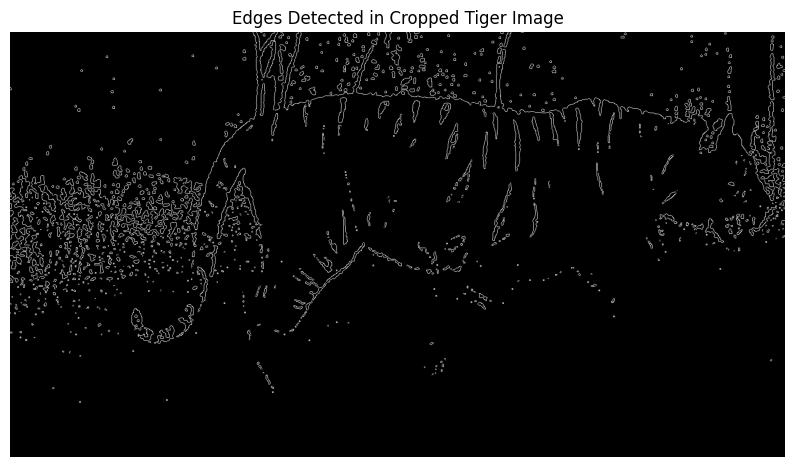


0: 384x640 1 zebra, 79.7ms
Speed: 2.7ms preprocess, 79.7ms inference, 1.2ms postprocess per image at shape (1, 3, 384, 640)


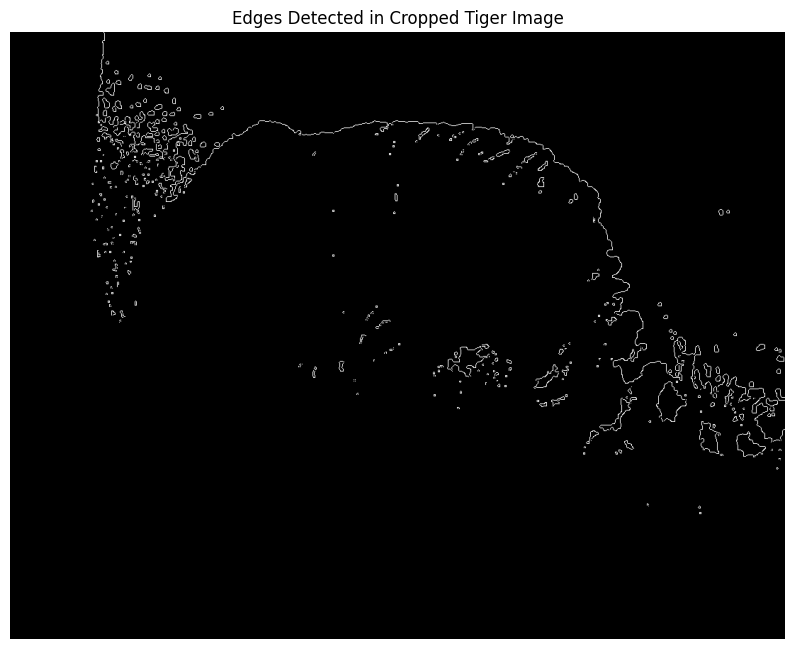


0: 480x640 1 zebra, 83.8ms
Speed: 4.3ms preprocess, 83.8ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)


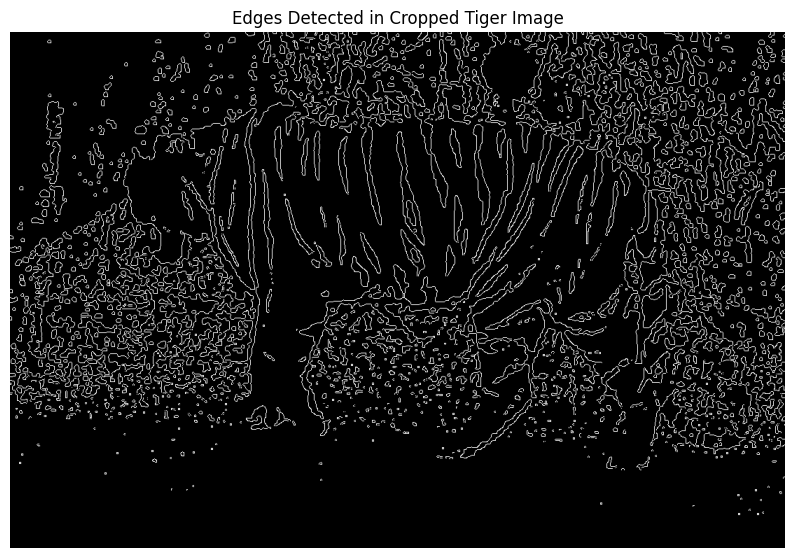

In [27]:
for image in images:
    cropped_image = crop_tiger(image)

    if cropped_image is not None:
        edges = find_edges(cropped_image)
        plot_image(edges, title="Edges Detected in Cropped Tiger Image", cmap='gray')

In [28]:
def find_edges_without_masking(image):
    grey = cv.cvtColor(image, cv.COLOR_RGB2GRAY)
    blurred = cv.GaussianBlur(grey, (5, 5), 3)
    canny = cv.Canny(blurred, 150, 250)
    return canny


0: 480x640 1 zebra, 125.4ms
Speed: 4.5ms preprocess, 125.4ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 94.4ms
Speed: 4.1ms preprocess, 94.4ms inference, 1.5ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 zebra, 65.5ms
Speed: 3.2ms preprocess, 65.5ms inference, 1.1ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 person, 87.7ms
Speed: 3.2ms preprocess, 87.7ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 (no detections), 145.1ms
Speed: 6.5ms preprocess, 145.1ms inference, 0.8ms postprocess per image at shape (1, 3, 480, 640)

0: 480x640 1 zebra, 71.9ms
Speed: 2.9ms preprocess, 71.9ms inference, 1.2ms postprocess per image at shape (1, 3, 480, 640)

0: 384x640 1 zebra, 83.3ms
Speed: 2.3ms preprocess, 83.3ms inference, 1.3ms postprocess per image at shape (1, 3, 384, 640)

0: 480x640 1 zebra, 84.1ms
Speed: 3.4ms preprocess, 84.1ms inference, 1.0ms postprocess per image at shape (1,

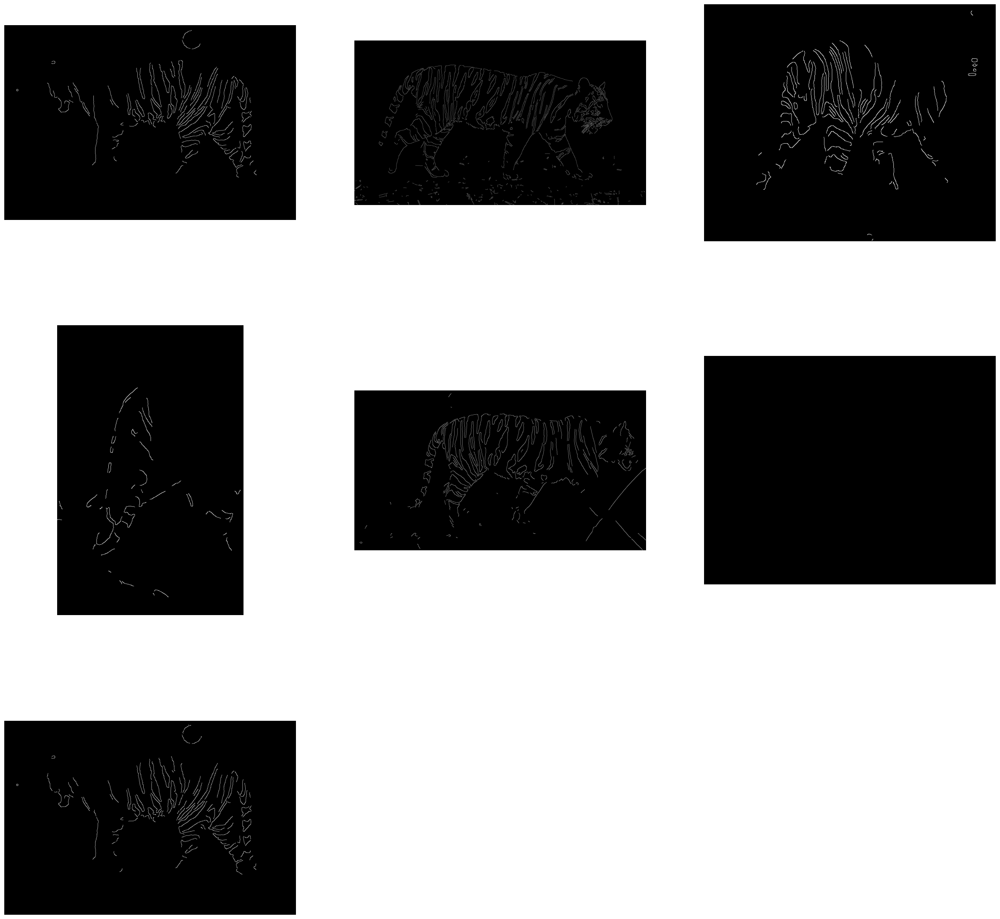

In [29]:
plot_img = []

for image in images:
    cropped_image = crop_tiger(image)
    
    if cropped_image is not None:
        edges = find_edges_without_masking(cropped_image)
        plot_img.append(edges)

plot_images(plot_img, cmap='gray', ncols=3)